# Analytics - query to reference mapping  

This notebook is based on and adapted from this scvi-tools tutorial: https://docs.scvi-tools.org/en/stable/tutorials/notebooks/query_hlca_knn.html

In [1]:
import os
os.environ['R_HOME'] = '/home/cane/miniconda3/envs/hub_paper/lib/R'
import milopy

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/cupy/_environment.py:487: UserWarning: 
--------------------------------------------------------------------------------

  CuPy may not function correctly because multiple CuPy packages are installed
  in your environment:

    cupy-cuda11x, cupy-cuda12x

  Follow these steps to resolve this issue:

    1. For all packages listed above, run the following command to remove all
       existing CuPy installations:

         $ pip uninstall <package_name>

      If you previously installed CuPy via conda, also run the following:

         $ conda uninstall cupy

    2. Install the appropriate CuPy package.
       Refer to the Installation Guide for detailed instructions.

         https://docs.cupy.dev/en/stable/install.html

--------------------------------------------------------------------------------

  warnings.warn(f'''


In [2]:
import scvi
import mplscience
import matplotlib.pyplot as plt
import os
import pynndescent
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from scvi.data._download import _download
import anndata

scvi.settings.seed = 1

# plotting commands for the styling
mplscience.set_style(reset_current=True, name="default")

%load_ext autoreload
%autoreload 2

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 1


## Citations

scArches:  
Mohammad Lotfollahi, Mohsen Naghipourfar, Malte D. Luecken, Matin Khajavi, Maren Büttner, Marco Wagenstetter, Žiga Avsec, Adam Gayoso, Nir Yosef, Marta Interlandi, Sergei Rybakov, Alexander V. Misharin, and Fabian J. Theis. Mapping single-cell data to reference atlases by transfer learning. Nature Biotechnology, 40(1):121–130, August 2021. doi:10.1038/s41587-021-01001-7.  

scANVI:  
Chenling Xu, Romain Lopez, Edouard Mehlman, Jeffrey Regier, Michael I Jordan, and Nir Yosef. Probabilistic harmonization and annotation of single-cell transcriptomics data with deep generative models. Molecular Systems Biology, January 2021. doi:10.15252/msb.20209620.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

In [4]:
local_dir = "/external_data/other/scvi-hub/scvi-hub/"

## 1️⃣ Download the pre-trained model

Here we use the HLCA dataset.

Sikkema, L., Ramírez-Suástegui, C., Strobl, D.C. et al. An integrated cell atlas of the lung in health and disease. Nat Med 29, 1563–1577 (2023). https://doi.org/10.1038/s41591-023-02327-2

Let's download the pre-trained model

In [47]:
model_url = "https://huggingface.co/scvi-tools/human-lung-cell-atlas/resolve/main/model.pt"
_download(model_url, local_dir, "model.pt")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/model.pt already downloaded                               


## 2️⃣ Download the query data

For the query, we will use samples from the following publication:  

- Dysregulated lung stroma drives emphysema exacerbation by potentiating resident lymphocytes to suppress an epithelial stem cell reservoir

    Chaoqun Wang
    Ben Hyams
    Nancy C. Allen
    Paul Wolters
    Ari B. Molofsky
    Tien Peng 6


In [39]:
from scvi.data import cellxgene

adata_url = "https://cellxgene.cziscience.com/e/1e5bd3b8-6a0e-4959-8d69-cafed30fe814.cxg/"
adata_immune = cellxgene(adata_url, filename="emphysema_immune.h5ad", save_path=local_dir)
adata_url = "https://cellxgene.cziscience.com/e/4b6af54a-4a21-46e0-bc8d-673c0561a836.cxg/"
adata_nonimmune = cellxgene(adata_url, filename="emphysema_nonimmune.h5ad", save_path=local_dir)
adata_url = "https://cellxgene.cziscience.com/e/214bf9eb-93db-48c8-8e3c-9bb22fa3bc63.cxg/"
adata_at2 = cellxgene(adata_url, filename="emphysema_at2.h5ad", save_path=local_dir)

In [40]:
adata_nonimmune[np.intersect1d(adata_nonimmune.obs_names, adata_at2.obs_names)].obs['celltype'] = adata_at2[np.intersect1d(adata_nonimmune.obs_names, adata_at2.obs_names)].obs['celltype']

/tmp/ipykernel_1429064/53203445.py:1: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_nonimmune[np.intersect1d(adata_nonimmune.obs_names, adata_at2.obs_names)].obs['celltype'] = adata_at2[np.intersect1d(adata_nonimmune.obs_names, adata_at2.obs_names)].obs['celltype']


In [41]:
query_data = anndata.concat([adata_immune, adata_nonimmune], join='outer', label='compartment', keys=['immune', 'nonimmune'])
query_data.var = adata_nonimmune.var

In [ ]:
query_data.X = query_data.raw.X

In [46]:
query_data_raw = query_data.copy()

In [9]:
query_data.obs['dataset'] = 'emphysema'

## 3️⃣ Build a query model

Use `prepare_query_anndata` to re-order the genes and pad any missing genes with 0s, so that query_adata matches exactly the reference in terms of its gene set.  

In [10]:
scvi.model.SCANVI.prepare_query_anndata(query_data, local_dir)

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/model.pt already downloaded      
INFO     Found 98.5% reference vars in query data.                                                                 


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


In [11]:
query_data.obs["scanvi_label"] = "unlabeled"

In [12]:
query_model = scvi.model.SCANVI.load_query_data(query_data, local_dir, accelerator = "cpu")

INFO     File /home/cane/Documents/yoseflab/can/scvi-hub/scvi-hub-reproducibility/model.pt already downloaded      


/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)
An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [13]:
query_model.adata

AnnData object with n_obs × n_vars = 54085 × 2000
    obs: 'donor_id', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'seurat_clusters', 'celltype', 'organism_ontology_term_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'compartment', 'dataset', 'scanvi_label', '_scvi_batch', '_scvi_labels'
    var: 'name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'X_pca', 'X_umap'

Train the query model.

In [14]:
surgery_epochs = 200
train_kwargs_surgery = {
    "early_stopping": True,
    "early_stopping_monitor": "elbo_train",
    "early_stopping_patience": 10,
    "early_stopping_min_delta": 0.001,
    "plan_kwargs": {"weight_decay": 0.0},
}

In [15]:
query_model.train(
    max_epochs=surgery_epochs,
    accelerator="cuda",
    **train_kwargs_surgery,
)

INFO     Training for 200 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3090') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/200:   0%|          | 0/200 [00:00<?, ?it/s]

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/abc.py:119: FutureWarning: SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.

  return _abc_instancecheck(cls, instance)


Epoch 107/200:  54%|█████▎    | 107/200 [03:50<03:20,  2.15s/it, v_num=1, train_loss_step=857, train_loss_epoch=874]  
Monitored metric elbo_train did not improve in the last 10 records. Best score: 948.408. Signaling Trainer to stop.


In [16]:
query_data.obsm['X_scanvi_emb'] = query_model.get_latent_representation()

In [17]:
query_save_path = f"{local_dir}/query_model"
query_model.save(query_save_path, overwrite=True)
query_data.write(f"{local_dir}/query_data_emphysema.h5ad")

## 4️⃣ Learn a neighbors index on reference latent space  

Get the "latent space" from our embeddings. It is essentially just the mean of the latent distribution.

In [ ]:
fname = "HLCA_full_v1.1_emb.h5ad"
adata = sc.read(os.path.join(local_dir, fname), backup_url=f"https://zenodo.org/record/7599104/files/{fname}")
adata = adata[adata.obs["core_or_extension"] == "core"].copy()

In [ ]:
from scvi.data import cellxgene

adata_url = "https://cellxgene.cziscience.com/e/9f222629-9e39-47d0-b83f-e08d610c7479.cxg/"
adata = cellxgene(adata_url, filename="adata_full.h5ad", save_path=local_dir)

In [ ]:
pd.options.display.max_rows = 1000

In [ ]:
labeled_adata = adata[adata.obs['ann_finest_level']!='Unknown']

## 5️⃣ Predict cell types

Let's predict using a different cell type than we did earlier, as that is too coarse grained (compartment-level resolution).

In [22]:
ref_nn_index = pynndescent.NNDescent(labeled_adata.obsm['X_scanvi_emb'])
ref_nn_index.prepare()

In [23]:
ref_neighbors, ref_distances = ref_nn_index.query(query_data.obsm['X_scanvi_emb'])

In [24]:
def distances_to_affinities(distances):
    # convert distances to affinities
    stds = np.std(distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)
    distances_tilda = np.exp(-np.true_divide(distances, stds))
    weights = distances_tilda / np.sum(
        distances_tilda, axis=1, keepdims=True
    )
    return weights

# import numba
# @numba.njit
def weighted_prediction(weights, ref_cats):
    """Get highest weight category."""
    N = len(weights)
    predictions = np.zeros((N,), dtype=ref_cats.dtype)
    uncertainty = np.zeros((N,))
    for i in range(N):
        obs_weights = weights[i]
        obs_cats = ref_cats[i]
        best_prob = 0
        for c in np.unique(obs_cats):
            cand_prob = np.sum(obs_weights[obs_cats == c])
            if cand_prob > best_prob:
                best_prob = cand_prob
                predictions[i] = c
                uncertainty[i] = max(1 - best_prob, 0)

    return predictions, uncertainty

weights = distances_to_affinities(ref_distances)

### Predict

In [25]:
label_key = "ann_finest_level"
ref_cats = labeled_adata.obs[label_key].cat.codes.to_numpy()[ref_neighbors]
p, u = weighted_prediction(weights, ref_cats)
p = np.asarray(labeled_adata.obs[label_key].cat.categories)[p]

query_data.obs["celltype_pred"], query_data.obs["celltype_uncertainty"] = p, u

In [26]:
pd.options.display.max_rows = 1000

### Evaluate predictions

Finally, let's evaluate predictions.

In [27]:
query_data.obs[["celltype_pred", "celltype_uncertainty"]]

,celltype_pred,celltype_uncertainty
index,,
AAACCCAAGCGTTCAT-1_1,CD8 T cells,0.000000e+00
AAACCCAGTCCTCCAT-1_1,CD4 T cells,5.960464e-08
AAACCCAGTCGCATGC-1_1,Classical monocytes,0.000000e+00
AAACCCATCAAACGTC-1_1,CD4 T cells,0.000000e+00
AAACGAAAGCACGATG-1_1,Classical monocytes,0.000000e+00
...,...,...
TTTGGTTGTACGTGAG-1_6,Alveolar fibroblasts,0.000000e+00
TTTGGTTGTAGCTCGC-1_6,AT2,0.000000e+00
TTTGGTTTCTATACGG-1_6,Pericytes,0.000000e+00


0.06056932175050351 1.1920928955078125e-07


<Axes: ylabel='Density'>

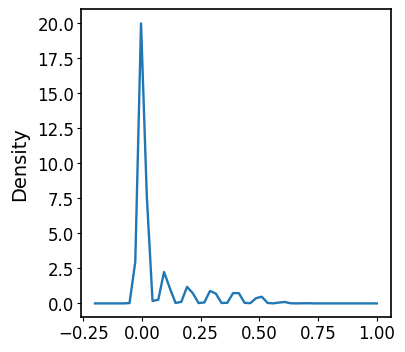

In [28]:
print(query_data.obs["celltype_uncertainty"].mean(), np.quantile(query_data.obs["celltype_uncertainty"], 0.75))
query_data.obs["celltype_uncertainty"].plot(kind='density', ind=np.linspace(-0.2, 1))

In [29]:
query_data.obs

,donor_id,nCount_RNA,nFeature_RNA,percent.mt,seurat_clusters,celltype,organism_ontology_term_id,assay_ontology_term_id,self_reported_ethnicity_ontology_term_id,tissue_ontology_term_id,...,tissue,self_reported_ethnicity,development_stage,compartment,dataset,scanvi_label,_scvi_batch,_scvi_labels,celltype_pred,celltype_uncertainty
index,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGCGTTCAT-1_1,NL1,2064.0,978,8.624031,1,T cell,NCBITaxon:9606,EFO:0009922,HANCESTRO:0005,UBERON:0002299,...,alveolus of lung,European,63-year-old human stage,immune,emphysema,unlabeled,14,28,CD8 T cells,0.000000e+00
AAACCCAGTCCTCCAT-1_1,NL1,2084.0,1106,7.869482,0,T cell,NCBITaxon:9606,EFO:0009922,HANCESTRO:0005,UBERON:0002299,...,alveolus of lung,European,63-year-old human stage,immune,emphysema,unlabeled,14,28,CD4 T cells,5.960464e-08
AAACCCAGTCGCATGC-1_1,NL1,16808.0,3587,5.021418,2,Monocyte,NCBITaxon:9606,EFO:0009922,HANCESTRO:0005,UBERON:0002299,...,alveolus of lung,European,63-year-old human stage,immune,emphysema,unlabeled,14,28,Classical monocytes,0.000000e+00
AAACCCATCAAACGTC-1_1,NL1,2377.0,1001,7.824989,0,T cell,NCBITaxon:9606,EFO:0009922,HANCESTRO:0005,UBERON:0002299,...,alveolus of lung,European,63-year-old human stage,immune,emphysema,unlabeled,14,28,CD4 T cells,0.000000e+00
AAACGAAAGCACGATG-1_1,NL1,9414.0,2704,9.400892,4,Monocyte,NCBITaxon:9606,EFO:0009922,HANCESTRO:0005,UBERON:0002299,...,alveolus of lung,European,63-year-old human stage,immune,emphysema,unlabeled,14,28,Classical monocytes,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTACGTGAG-1_6,Emp3,18680.0,4631,4.014989,3,Proximal fibroblast,NCBITaxon:9606,EFO:0009922,unknown,UBERON:0002299,...,alveolus of lung,unknown,73-year-old human stage,nonimmune,emphysema,unlabeled,14,28,Alveolar fibroblasts,0.000000e+00
TTTGGTTGTAGCTCGC-1_6,Emp3,15115.0,3189,9.646047,0,AT2,NCBITaxon:9606,EFO:0009922,unknown,UBERON:0002299,...,alveolus of lung,unknown,73-year-old human stage,nonimmune,emphysema,unlabeled,14,28,AT2,0.000000e+00
TTTGGTTTCTATACGG-1_6,Emp3,5297.0,2375,4.172173,13,Pericyte,NCBITaxon:9606,EFO:0009922,unknown,UBERON:0002299,...,alveolus of lung,unknown,73-year-old human stage,nonimmune,emphysema,unlabeled,14,28,Pericytes,0.000000e+00


In [30]:
def get_comparison_df(uncertainty_threshold = None):
    # build comparison_df
    comparison_df = pd.DataFrame(index=query_data.obs.index, columns=["pred", "ground_truth", "pred_uncertainty"])
    comparison_df["pred"] = query_data.obs["celltype_pred"]
    comparison_df["pred_uncertainty"] = query_data.obs["celltype_uncertainty"]
    comparison_df["ground_truth"] = query_data.obs["celltype"].astype(str).fillna("Unknown")

    # we dont care about cases where we dont know the ground truth (in fact we could have skipped prediction for these altogether)
    n_before = len(comparison_df)
    comparison_df = comparison_df[comparison_df["ground_truth"] != "nan"]
    n_filtered = n_before-len(comparison_df)
    pct_filtered = 100*n_filtered/n_before
    print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with unknown ground truth")

    if uncertainty_threshold is not None:
        # filter out uncertainty > threshold
        n_before = len(comparison_df)
        comparison_df = comparison_df[comparison_df["pred_uncertainty"] <= uncertainty_threshold]
        n_filtered = n_before-len(comparison_df)
        pct_filtered = 100*n_filtered/n_before
        print(f"filtered out {n_filtered} barcodes ({pct_filtered:.2f}%) with pred uncertainty > {uncertainty_threshold}")

    return comparison_df

In [31]:
comparison_df = get_comparison_df(uncertainty_threshold=0.4)

filtered out 0 barcodes (0.00%) with unknown ground truth
filtered out 2432 barcodes (4.50%) with pred uncertainty > 0.4


## 6️⃣ Plot
Let's plot heatmap

In [3]:
temp_fig_dir = "/home/cane/Documents/yoseflab/can/scvi-hub/query_ref/"

In [33]:
# https://docs.scvi-tools.org/en/stable/tutorials/notebooks/cellassign_tutorial.html#Model-reproducibility
confusion_matrix = pd.crosstab(
    comparison_df["pred"],
    comparison_df["ground_truth"], 
    rownames=["Predicted label"],
    colnames=["True label"],
)
confusion_matrix /= confusion_matrix.sum(1).ravel().reshape(-1, 1)
confusion_matrix *= 100

In [34]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

def _prediction_eval(
    pred,
    labels,
    name,
    x_label="",
    y_label="",
    save_fig=None,
):
    """Generate confusion matrix."""
    types, _ = np.unique(np.concatenate([labels, pred]), return_inverse=True)
    mtx = confusion_matrix(labels, pred, normalize="true")
    df = pd.DataFrame(mtx, columns=types, index=types)
    df = df.loc[np.unique(labels), np.unique(pred)]
    df = df.rename_axis(x_label, axis="columns")
    df = df.rename_axis(y_label)
    #df = df[df.idxmax(axis=1).unique()]
    df = df[pred.value_counts().index]
    positions = [df.columns.get_loc(index) for index in df.idxmax(axis=1)]
    df = df.loc[df.index[np.argsort(positions)]]
    fig, ax = plt.subplots(figsize=[15, 15])
    sns.heatmap(df.T, linewidths=0.005, cmap="OrRd", square=True)
    plt.tight_layout()
    plt.title(name)
    plt.xlabel('PopV prediction')
    plt.ylabel('Original Annotation')

    if save_fig:
        plt.savefig(save_fig)
    plt.show()
    
    return df

In [35]:
comparison_df.loc[comparison_df["pred"].isin(comparison_df["pred"].value_counts()[comparison_df["pred"].value_counts()<10].index), "pred"] = "Other"

In [36]:
comparison_df.loc[comparison_df["pred"].isin(comparison_df["pred"].value_counts()[comparison_df["pred"].value_counts()<10].index), "pred"]

Series([], Name: pred, dtype: object)

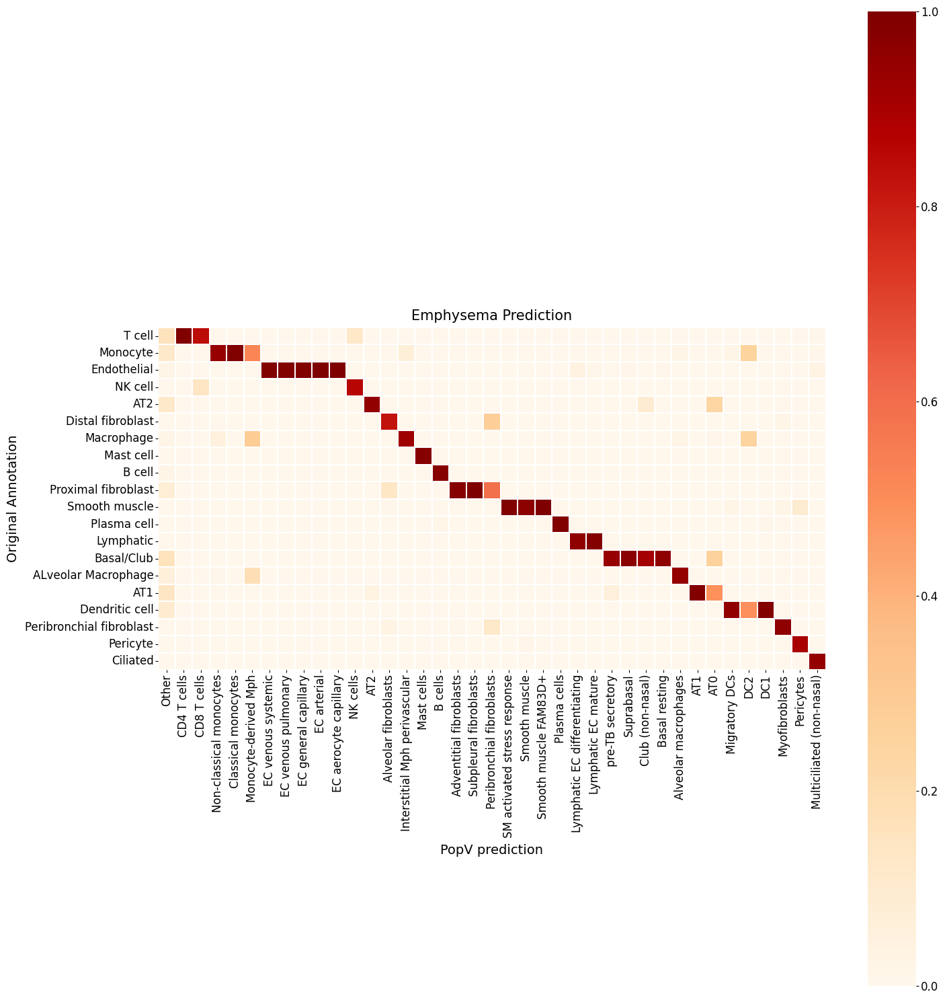

In [37]:
_ = _prediction_eval(
    pred=comparison_df["ground_truth"],
    labels=comparison_df["pred"],
    name='Emphysema Prediction',
    x_label=["Predicted label"],
    y_label=["True label"],
    save_fig=f"figures/emphysema_celltype_prediction.pdf",
)

Some notes on the new HLCA annotations (https://zenodo.org/record/6337966/ vs https://zenodo.org/record/7599104):
- All new 60 cells have None for ann_level_3 annotations.
- No cells was predicted as "Smooth muscle FAM83D+" (even before thresholding on prediction uncertainty)
- In prev ann_level_3, not in new: 'Fibromyocytes'
- In new ann_level_3, not in prev: 'Smooth muscle FAM83D+'
- Only 565 cells differ between prev and new ann_level_3 annotations and their distribution is (prev, new):  
Fibromyocytes,Smooth muscle FAM83D+   -> 335  
Secretory,AT2                       ->   230

In [38]:
len(comparison_df["ground_truth"].astype("category").cat.categories), len(comparison_df["pred"].astype("category").cat.categories)

(20, 39)

## 7️⃣ Visualize embeddings in the joint latent space

Combine embeddings

In [39]:
combined_adata = adata.concatenate(query_data, join='inner')
combined_adata.obs

sc.pp.neighbors(combined_adata, n_neighbors=30, use_rep="X_scanvi_emb", method='rapids')
sc.tl.umap(combined_adata, min_dist=0.3, method='rapids')

/tmp/ipykernel_466915/667177593.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_adata = adata.concatenate(query_data, join='inner')
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/merge.py:1337: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 1) with CUDA driver version (12, 0) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 0) to continue using cuDF.
  warnings.warn(


Visualize embeddings.

I do this on a device with more ram, but you can run it locally if you have enough ram.

In [40]:
combined_adata.write_h5ad(f"{local_dir}/combined_adata_emphysema.h5ad")

In [7]:
sc.set_figure_params(vector_friendly=True, dpi_save=300)

In [10]:
combined_adata = sc.read(f"{local_dir}/combined_adata_emphysema.h5ad")

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


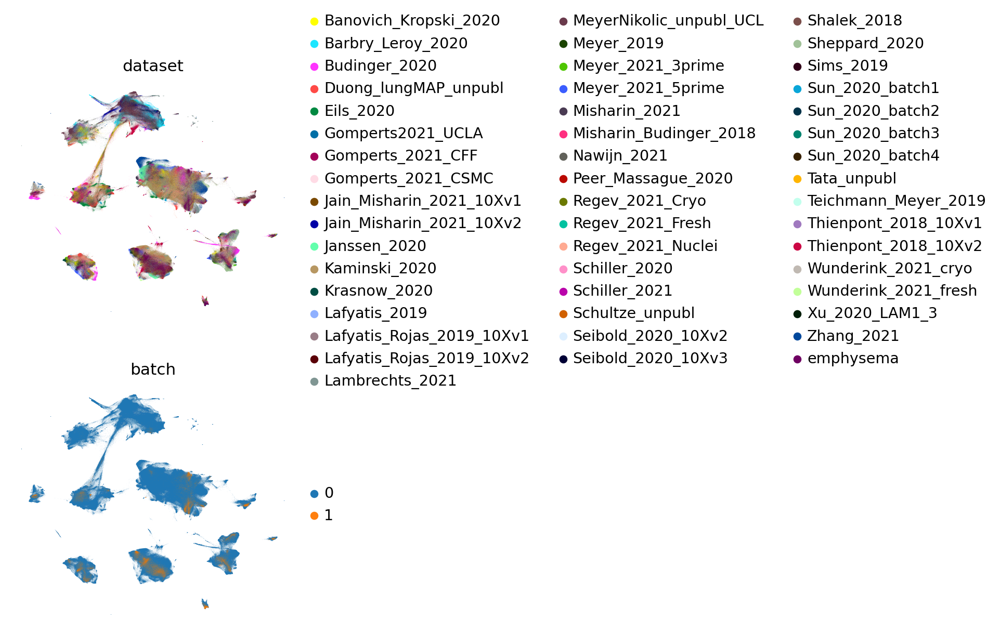

In [6]:
sc.pl.umap(
    combined_adata,
    color=["dataset", "batch"],
    ncols=1,
    frameon=False,
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


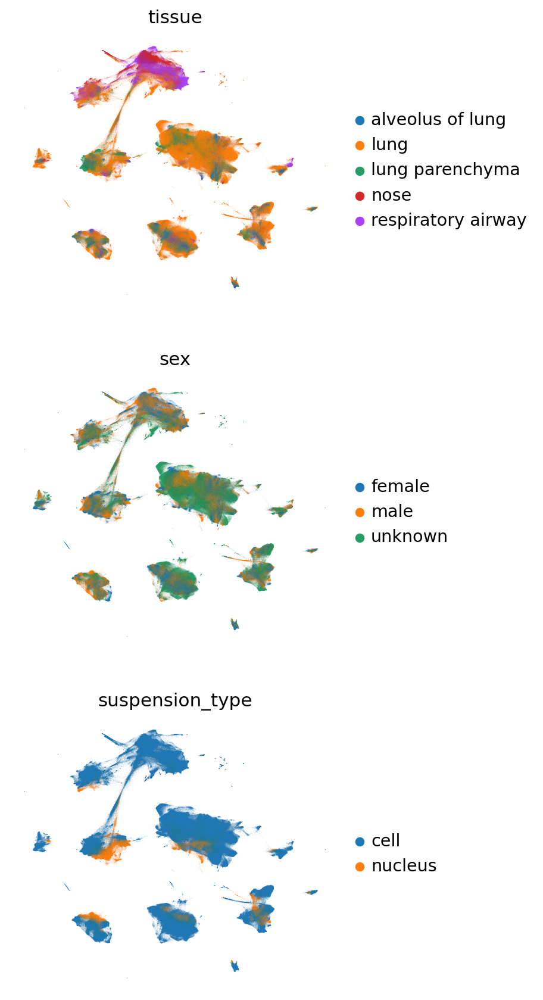

In [7]:
sc.pl.umap(
    combined_adata,
    color=["tissue", "sex", "suspension_type"],
    ncols=1,
    frameon=False,
)

Let's plot only batch. It is 1:1 equivalent with the dataset anyway as can be seen below.

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


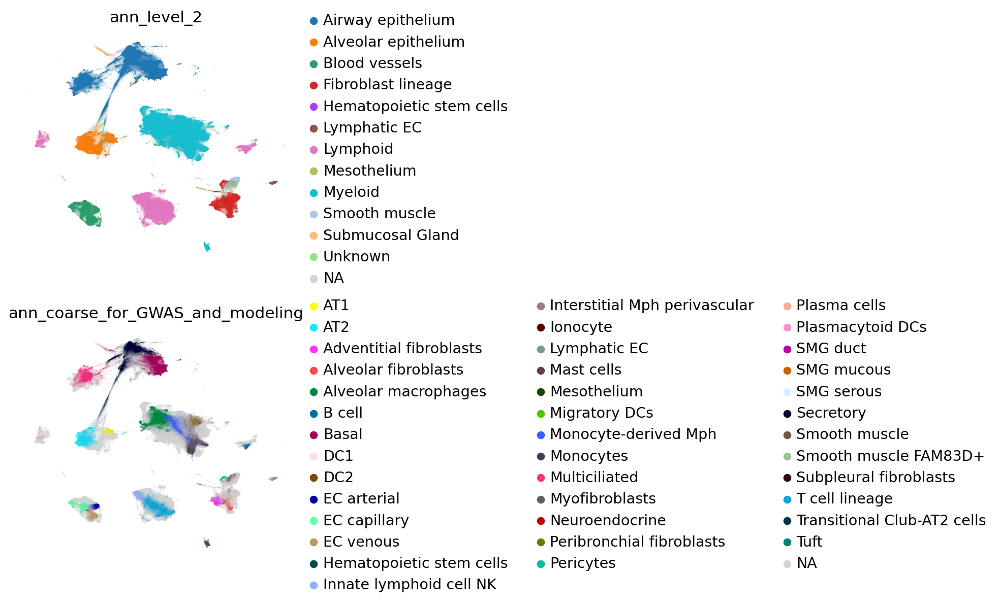

In [8]:
sc.pl.umap(
    combined_adata,
    color=["ann_level_2", "ann_coarse_for_GWAS_and_modeling"],
    ncols=1,
    frameon=False,
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterp

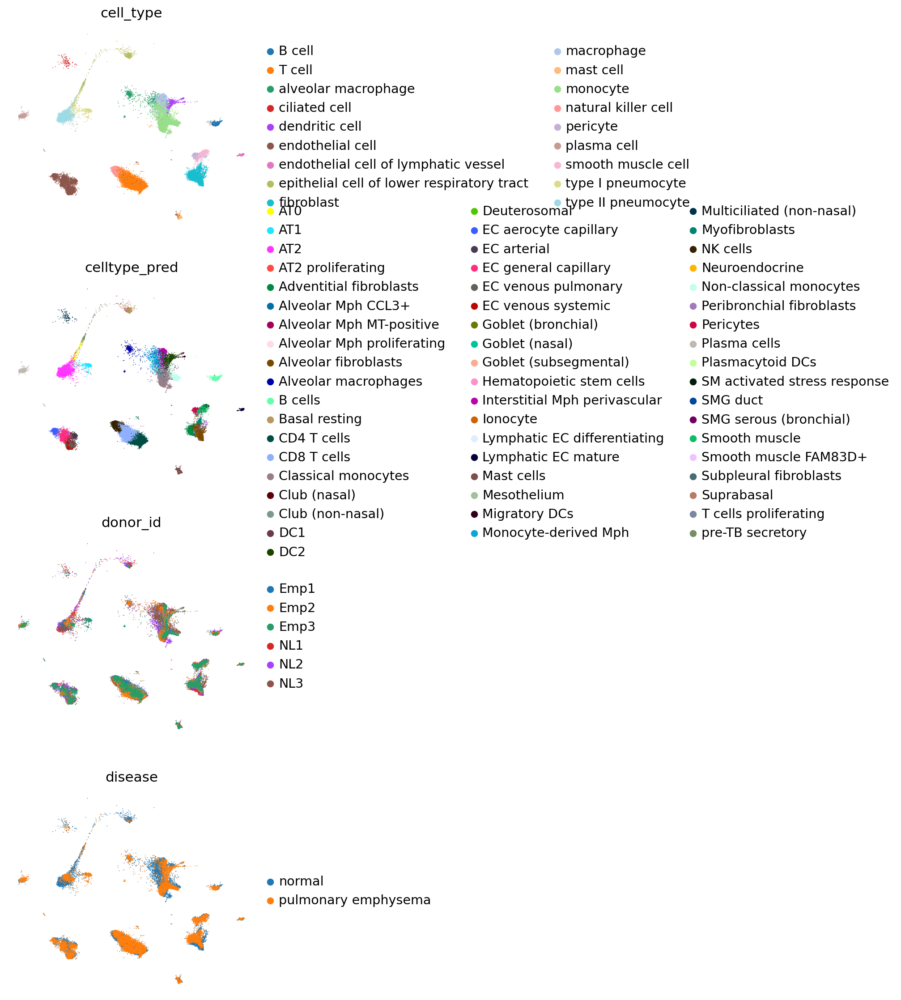

In [9]:
sc.pl.umap(
    combined_adata[combined_adata.obs["dataset"] == "emphysema"],
    color=["cell_type", "celltype_pred", "donor_id", "disease"],
    ncols=1,
    frameon=False,
)

In [10]:
pd.options.display.max_rows = 1000

In [11]:
combined_adata.obs["batch"] = "ref"
combined_adata.obs.loc[combined_adata.obs["dataset"] == "emphysema", "batch"] = "query"

In [12]:
combined_adata.obs['umap_size'] = 120000 / combined_adata.n_obs
combined_adata.obs.loc[combined_adata.obs["dataset"] == "emphysema", "umap_size"] = 120000 / combined_adata.n_obs * 30 # if you want to make the query dataset points bigger

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


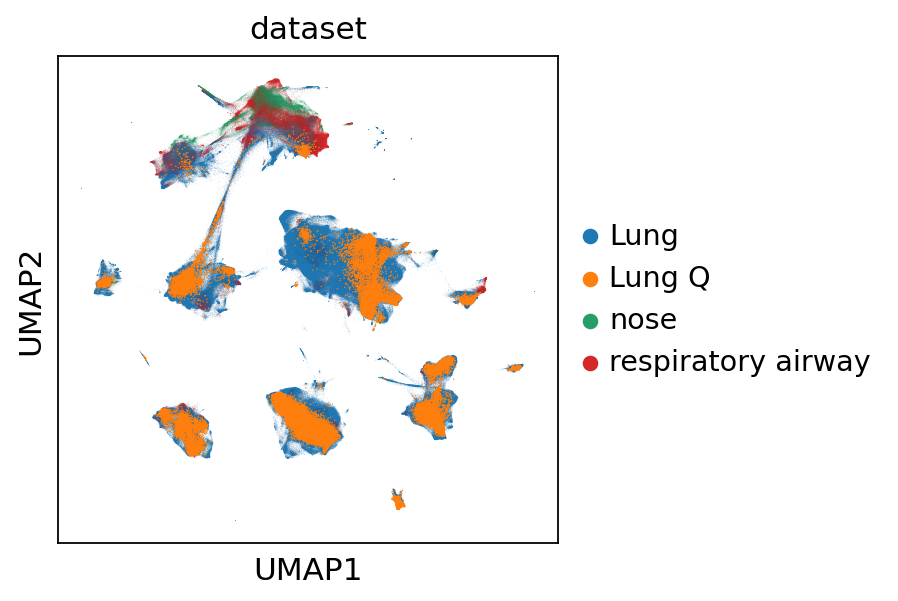

In [104]:
custom_pal = {"ref": "#EAE0DA", "query": "#DC0000"}
combined_adata.obs['coarse_tissue'] = ['Lung Q' if 'alveolus' in i else 'Lung' if 'lung' in i else i for i in combined_adata.obs['tissue']]
sc.pl.umap(
    combined_adata,
    color=["coarse_tissue"],
    ncols=1,
    size=combined_adata.obs['umap_size'].values,
    frameon=True,
    save="combined_umap_batch.svg",
    #palette=custom_pal,
    title="dataset"
)

In [121]:
2

2

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


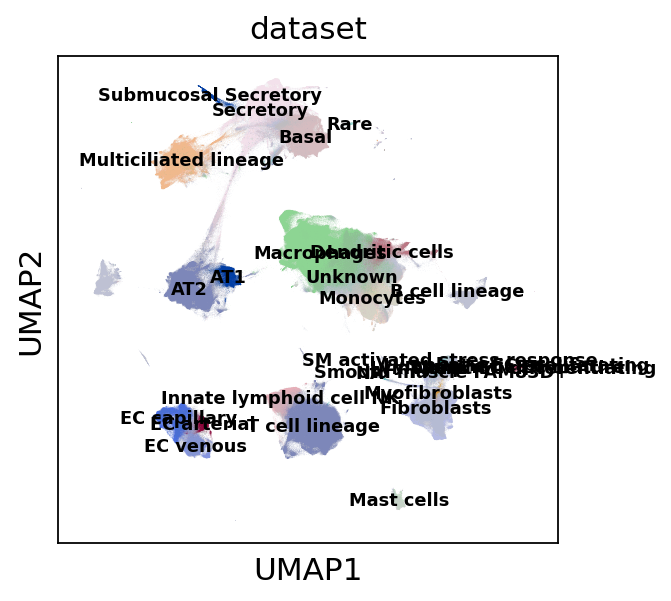

In [109]:
combined_adata.obs['lung_tissue'] = ['Lung' if 'lung' in i else 'Other' for i in combined_adata.obs['tissue']]
sc.pl.umap(
    combined_adata,
    color=["ann_level_3"],
    ncols=1,
    size=combined_adata.obs['umap_size'].values,
    frameon=True,
    save="combined_umap_celltype.svg",
    title="dataset",
    legend_loc='on data',
    legend_fontsize=8
)

In [15]:
combined_adata.obs[['batch', 'disease']].value_counts()

batch  disease                              
ref    normal                                   1305099
       COVID-19                                  341761
       pulmonary fibrosis                        268932
       interstitial lung disease                  68456
       chronic obstructive pulmonary disease      67943
       lung adenocarcinoma                        62807
       pneumonia                                  31923
query  pulmonary emphysema                        31792
ref    chronic rhinitis                           29137
query  normal                                     22293
ref    lung large cell carcinoma                  21167
       squamous cell lung carcinoma               20631
       cystic fibrosis                            17590
       lymphangioleiomyomatosis                   12374
       pleomorphic carcinoma                      10765
       hypersensitivity pneumonitis               10379
       non-specific interstitial pneumonia         8597
   

In [17]:
combined_adata.obs[['batch', 'tissue_sampling_method']].value_counts()

batch  tissue_sampling_method  
ref    donor_lung                  702873
       lung_explant                428431
       surgical_resection          292307
       autopsy                     205374
       balf                        202476
       brush                       164056
       biopsy                      100467
       scraping                     82297
       balf_cryopreserved           51689
       donor_lung_cryopreserved     46500
       autopsy_cryopreserved         4366
       biopsy_cryopreserved          1611
dtype: int64

In [18]:
combined_adata.obs['autopsy'] = ['Autopsy' if 'biopsy' in i else 'Other' for i in combined_adata.obs['tissue_sampling_method'].astype(str)]

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


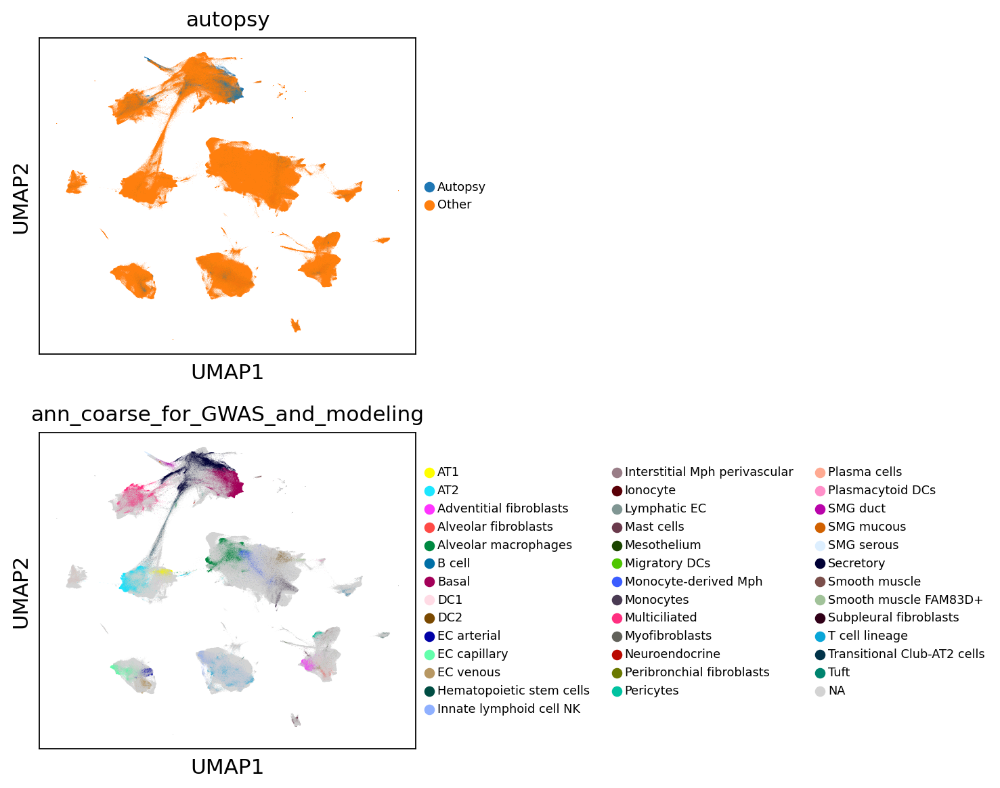

In [19]:
sc.pl.umap(
    combined_adata,
    color=["autopsy", "ann_coarse_for_GWAS_and_modeling"],
    ncols=1,
    #size=combined_adata.obs['umap_size'].values,
    frameon=True,
    size=0.1,
    #save="combined_umap_sampling.pdf",
    legend_fontsize=8,
    sort_order=False,
)

In [20]:
combined_adata.obs['tissue_sampling_method'].value_counts()

donor_lung                  702873
lung_explant                428431
surgical_resection          292307
autopsy                     205374
balf                        202476
brush                       164056
biopsy                      100467
scraping                     82297
balf_cryopreserved           51689
donor_lung_cryopreserved     46500
autopsy_cryopreserved         4366
biopsy_cryopreserved          1611
Name: tissue_sampling_method, dtype: int64

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_utils.py:431: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


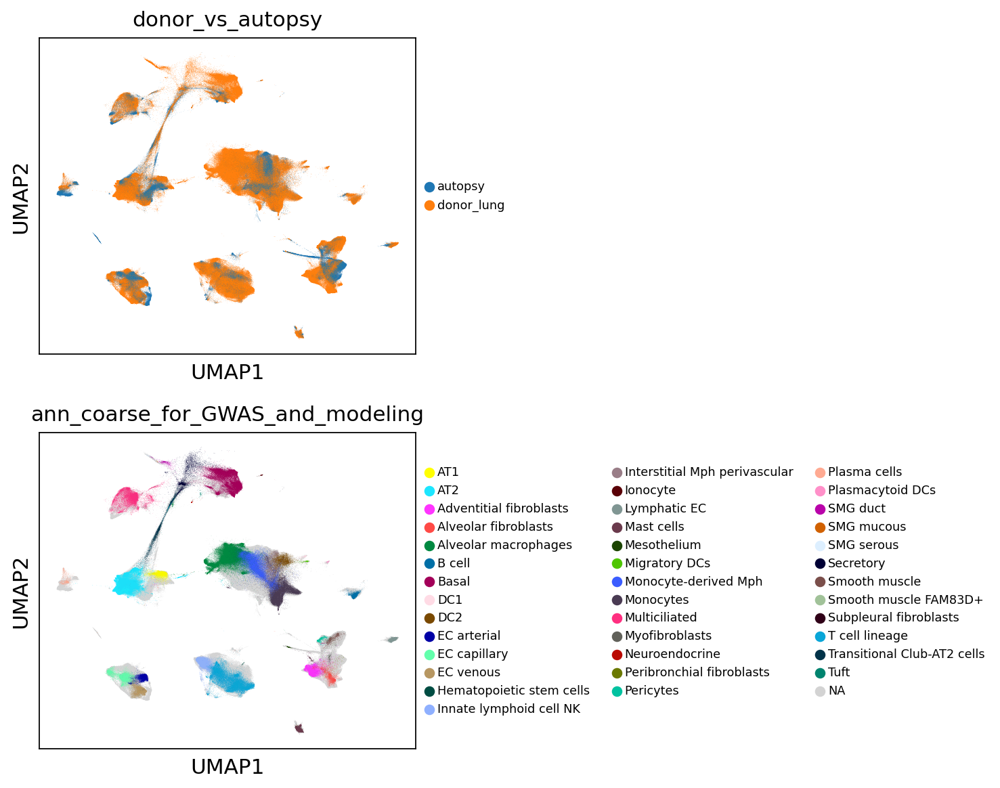

In [21]:
sc.pl.umap(
    combined_adata[combined_adata.obs['tissue_sampling_method'].astype(str).isin(['donor_lung', 'autopsy'])],
    color=["tissue_sampling_method", "ann_coarse_for_GWAS_and_modeling"],
    ncols=1,
    #size=combined_adata.obs['umap_size'].values,
    frameon=True,
    save="combined_umap_sampling.svg",
    title='donor_vs_autopsy',
    legend_fontsize=8
)

In [22]:
query_adata = combined_adata[combined_adata.obs["dataset"] == "emphysema"].copy()

In [23]:
sc.pp.neighbors(combined_adata, n_neighbors=100, use_rep='X_scanvi_emb', method='rapids')
combined_adata.uns["neighbors"]["params"]["use_rep"]

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 1) with CUDA driver version (12, 0) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 0) to continue using cuDF.
  warnings.warn(


'X_scanvi_emb'

In [60]:
milo_new.make_nhoods(combined_adata)
combined_adata.obsm["nhoods"]

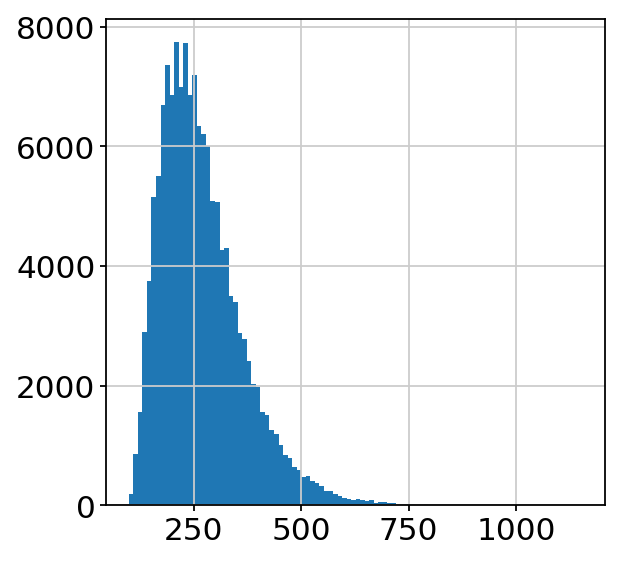

In [ ]:
nhood_size = np.array(combined_adata.obsm["nhoods"].sum(0)).ravel()
_ = plt.hist(nhood_size, bins=100)

In [33]:
import milopy
import milopy.core as milo

In [12]:
healthy_adata = combined_adata[combined_adata.obs['disease']=='normal'].copy()
healthy_adata.obs['donor_id'].cat.remove_unused_categories(inplace=True)
sc.pp.neighbors(healthy_adata, n_neighbors=100, use_rep='X_scanvi_emb', method='rapids')
milo.make_nhoods(healthy_adata)
## Count cells from each sample in each nhood
milo.count_nhoods(healthy_adata, sample_col="donor_id")

/tmp/ipykernel_3866458/4050899995.py:2: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  healthy_adata.obs['donor_id'].cat.remove_unused_categories(inplace=True)
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/cudf/utils/_numba.py:110: UserWarning: Using CUDA toolkit version (12, 1) with CUDA driver version (12, 0) requires minor version compatibility, which is not yet supported for CUDA driver versions 12.0 and above. It is likely that many cuDF operations will not work in this state. Please install CUDA toolkit version (12, 0) to continue using cuDF.
  warnings.warn(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


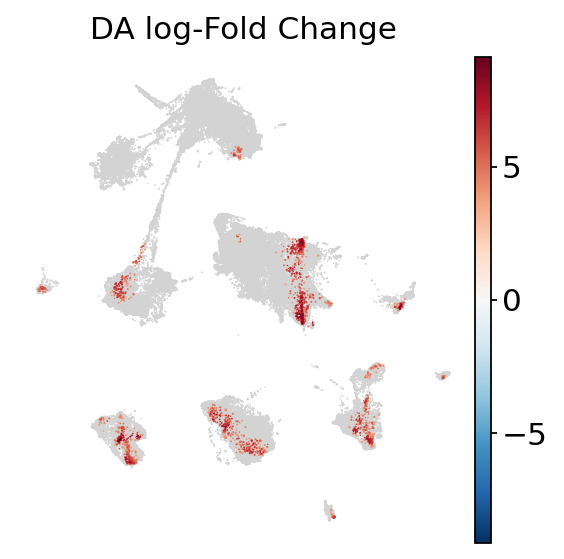

In [13]:
## Test for differential abundance between conditions
milo.DA_nhoods(healthy_adata, design="~ batch")

## Check results
milo_results = healthy_adata.uns["nhood_adata"].obs
milopy.utils.build_nhood_graph(healthy_adata)
milopy.plot.plot_nhood_graph(healthy_adata, alpha=0.1, min_size=0.01)

In [ ]:
milopy.plot.plot_nhood_graph(healthy_adata, alpha=0.1, min_size=0.2, save='healthy_emphysema_vs_hlca.svg')

In [34]:
emphysema_adata = combined_adata[combined_adata.obs["dataset"] == "emphysema"].copy()
emphysema_adata.obs['disease'].value_counts()

pulmonary emphysema    31792
normal                 22293
Name: disease, dtype: int64

In [35]:
sc.pp.neighbors(emphysema_adata, use_rep='X_scanvi_emb')
sc.tl.umap(emphysema_adata, min_dist=0.3)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


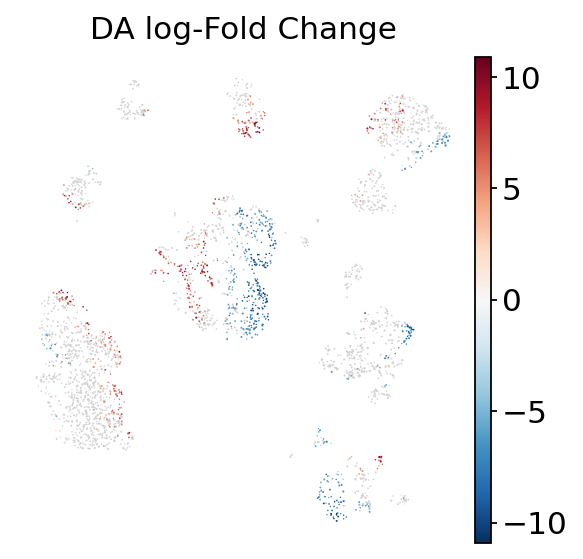

In [42]:
sc.pp.neighbors(emphysema_adata, n_neighbors=100, use_rep='X_scanvi_emb', method='rapids')
milo.make_nhoods(emphysema_adata)
## Count cells from each sample in each nhood
milo.count_nhoods(emphysema_adata, sample_col="donor_id")

## Test for differential abundance between conditions
milo.DA_nhoods(emphysema_adata, design="~ disease")

## Check results
milo_results = emphysema_adata.uns["nhood_adata"].obs
milopy.utils.build_nhood_graph(emphysema_adata)
milopy.plot.plot_nhood_graph(emphysema_adata, alpha=0.1, min_size=0.01)

In [43]:
/home/cane/Documents/scvi-tools/scvi-hub-models/suppl_fig16_totalvi_criticism.ipynb

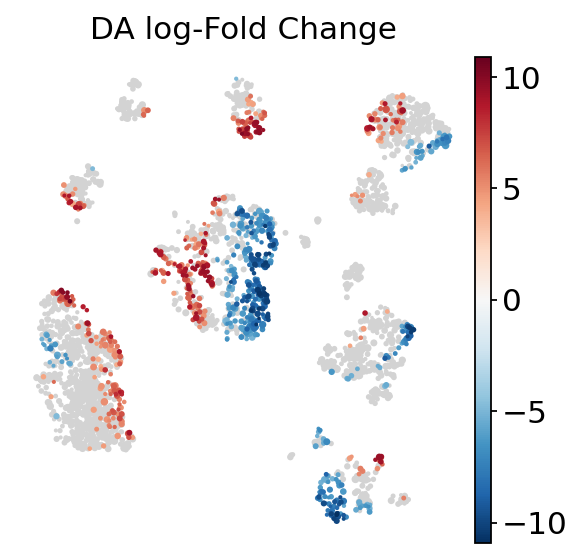

In [44]:
milopy.plot.plot_nhood_graph(emphysema_adata, alpha=0.1, min_size=0.1, save='emphysema_vs_healthy.svg')

In [ ]:
sc.pl.umap(
    emphysema_adata,
    color=["donor_id"],
    ncols=1,
    frameon=True,
    title="celltypes",
    save="emphysema_umap_donors.svg",
    legend_fontsize=8
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


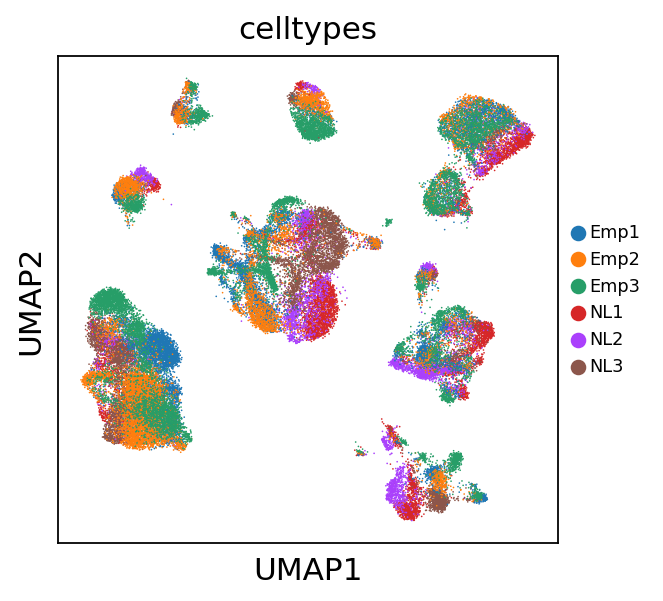

In [45]:
sc.pl.umap(
    emphysema_adata,
    color=["donor_id"],
    ncols=1,
    frameon=True,
    title="celltypes",
    save="emphysema_umap_donors.svg",
    legend_fontsize=8
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


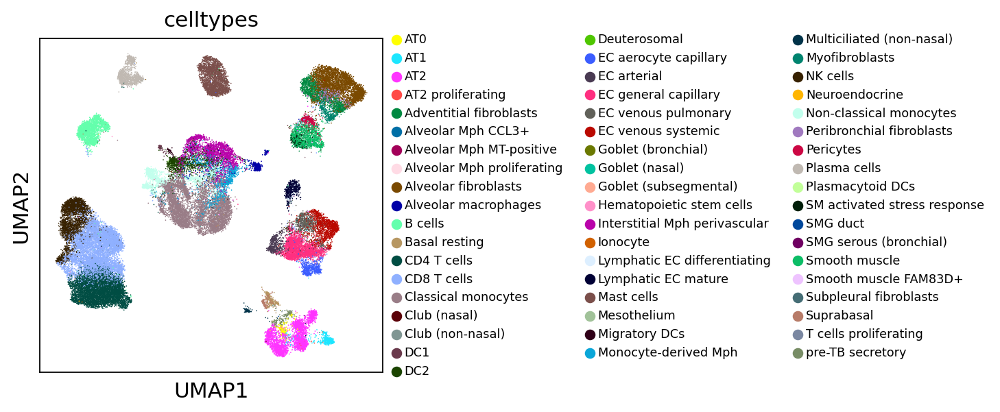

In [46]:
sc.pl.umap(
    emphysema_adata,
    color=["celltype_pred"],
    ncols=1,
    frameon=True,
    save="emphysema_umap_celltypes.svg",
    title="celltypes",
    legend_fontsize=8
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


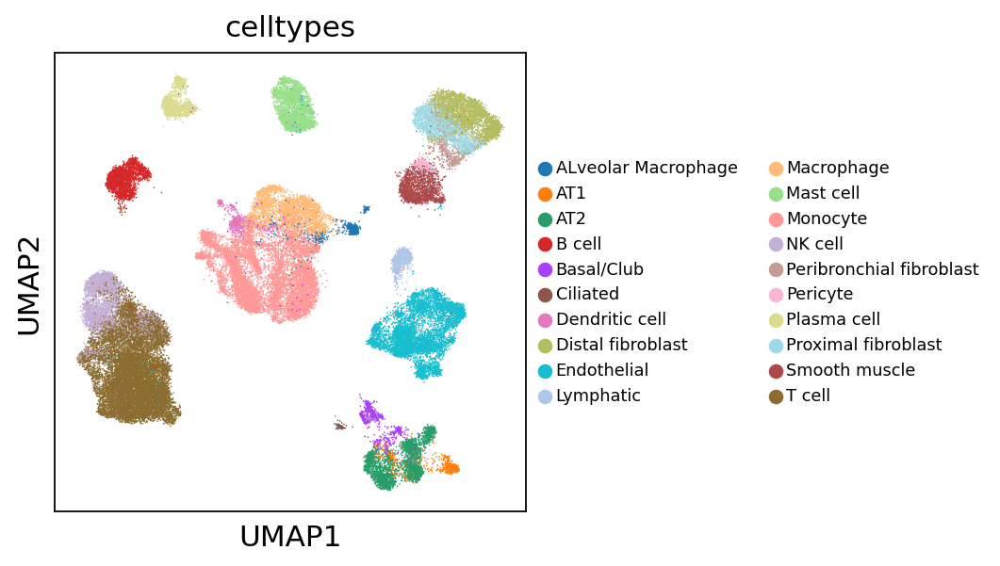

In [101]:
sc.pl.umap(
    emphysema_adata,
    color=["celltype"],
    ncols=1,
    frameon=True,
    save="emphysema_umap_celltypes_original.svg",
    title="celltypes",
    legend_fontsize=8
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


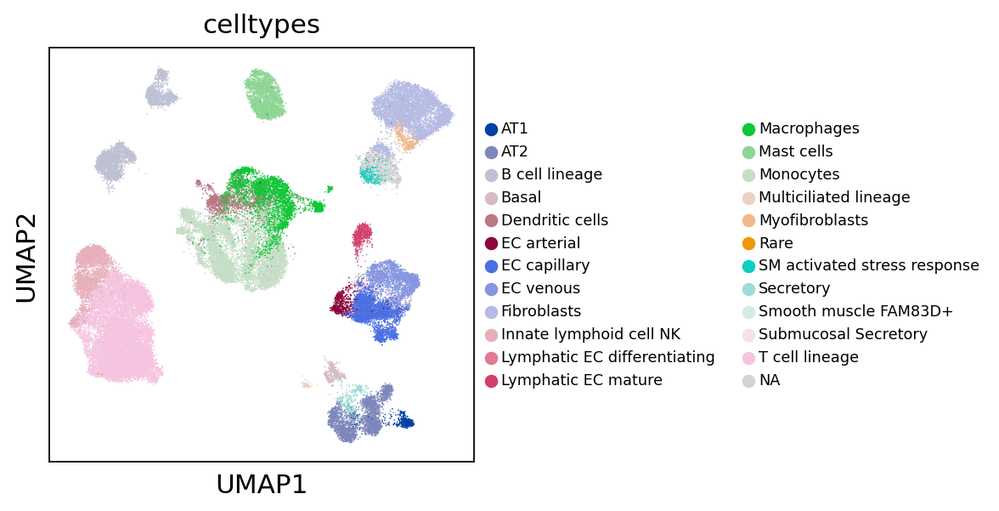

In [67]:
mapping_df = combined_adata.obs[['ann_finest_level', 'ann_level_3']].drop_duplicates().set_index('ann_finest_level')['ann_level_3'].to_dict()
mapping_df
emphysema_adata.obs['celltype_pred_coarse'] = emphysema_adata.obs['celltype_pred'].map(mapping_df)
sc.pl.umap(
    emphysema_adata,
    color=["celltype_pred_coarse"],
    ncols=1,
    frameon=True,
    save="emphysema_umap_celltypes_predicted_coarse.svg",
    title="celltypes",
    legend_fontsize=8
)

In [113]:
palette = {i:j for i, j in zip(emphysema_adata.obs['celltype_pred_coarse'].cat.categories, emphysema_adata.uns['celltype_pred_coarse_colors'])}

In [118]:
palette

{'AT1': '#023fa5',
 'AT2': '#7d87b9',
 'B cell lineage': '#bec1d4',
 'Basal': '#d6bcc0',
 'Dendritic cells': '#bb7784',
 'EC arterial': '#8e063b',
 'EC capillary': '#4a6fe3',
 'EC venous': '#8595e1',
 'Fibroblasts': '#b5bbe3',
 'Innate lymphoid cell NK': '#e6afb9',
 'Lymphatic EC differentiating': '#e07b91',
 'Lymphatic EC mature': '#d33f6a',
 'Macrophages': '#11c638',
 'Mast cells': '#8dd593',
 'Monocytes': '#c6dec7',
 'Multiciliated lineage': '#ead3c6',
 'Myofibroblasts': '#f0b98d',
 'Rare': '#ef9708',
 'SM activated stress response': '#0fcfc0',
 'Secretory': '#9cded6',
 'Smooth muscle FAM83D+': '#d5eae7',
 'Submucosal Secretory': '#f3e1eb',
 'T cell lineage': '#f6c4e1'}

In [119]:
for i in set(combined_adata.obs['ann_level_3'].cat.categories) - set(emphysema_adata.obs['celltype_pred_coarse'].cat.categories):
    palette[i] = '#FFFFFF'

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


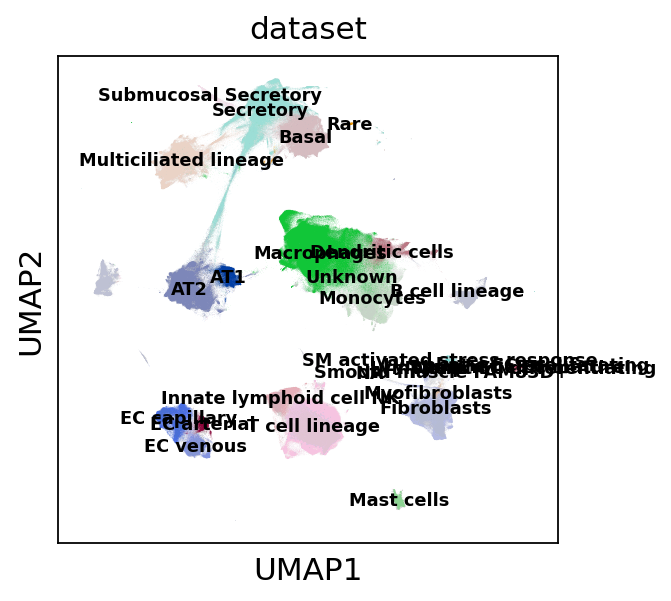

In [120]:
combined_adata.obs['lung_tissue'] = ['Lung' if 'lung' in i else 'Other' for i in combined_adata.obs['tissue']]
sc.pl.umap(
    combined_adata,
    color=["ann_level_3"],
    ncols=1,
    palette=palette,
    size=combined_adata.obs['umap_size'].values,
    frameon=True,
    save="combined_umap_celltype.svg",
    title="dataset",
    legend_loc='on data',
    legend_fontsize=8
)

In [51]:
emphysema_adata = sc.read_h5ad(f"{local_dir}/emphysema_adata_finished.h5ad")

In [52]:
fibroblast_idx = emphysema_adata.obs["celltype"].isin(['Distal fibroblast', 'Proximal fibroblast', 'Peribronchial fibroblast']) # ['Monocyte', 'Macrophage', 'Dendritic cell']) # 

fibroblast = emphysema_adata[fibroblast_idx].copy()

In [53]:
fibroblast.layers["normalized_counts"] = fibroblast.X.copy()
sc.pp.normalize_total(fibroblast, target_sum=1e4, layer="normalized_counts")
sc.pp.log1p(fibroblast, layer="normalized_counts")

In [54]:
fibroblast.var_names = fibroblast.var['feature_name-0']

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/anndata/_core/anndata.py:947: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['A1BG', 'A2M', 'ABCA1', 'ABCA3', 'ABCA6']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


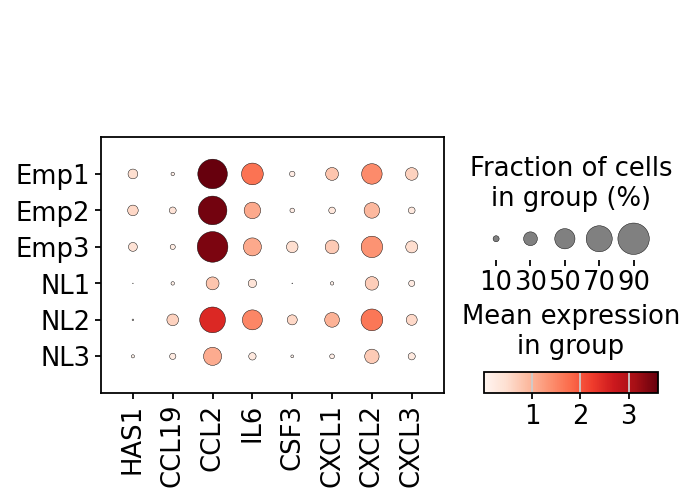

In [55]:
sc.pl.dotplot(
    fibroblast,
    var_names=["HAS1", "CCL19", "CCL2", "IL6", "CSF3", "CXCL1", "CXCL2", "CXCL3"],
    groupby="donor_id",
    save='emphysema_fibroblast_de_genes_patient.svg', layer="normalized_counts"
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


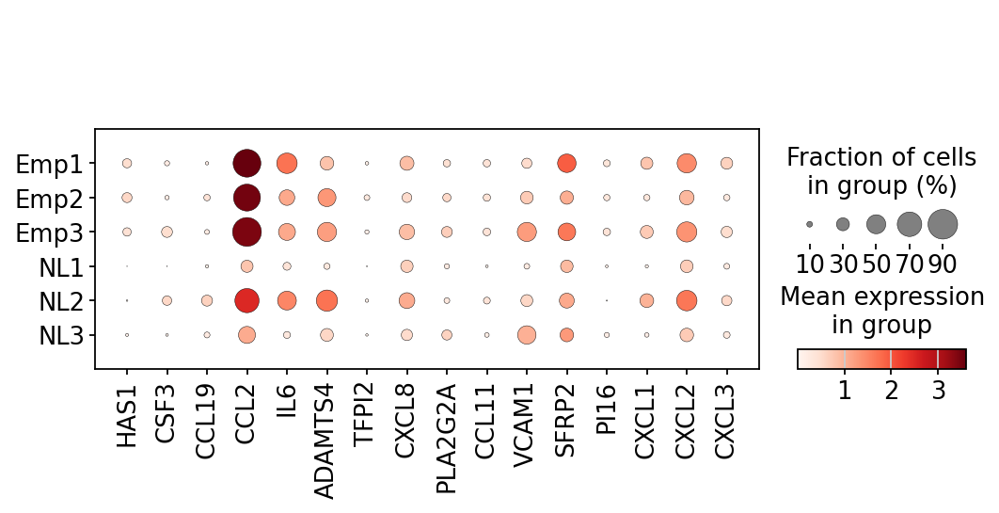

In [56]:
sc.pl.dotplot(
    fibroblast,
    var_names=["HAS1", "CSF3", "CCL19", "CCL2", "IL6", "ADAMTS4", "TFPI2", "CXCL8", "PLA2G2A", "CCL11", "VCAM1", "SFRP2", "PI16", "CXCL1", "CXCL2", "CXCL3"],
    groupby="donor_id",
    save='emphysema_fibroblast_de_genes_patient.svg', layer="normalized_counts"
)

In [72]:
sc.tl.rank_genes_groups(fibroblast, groupby="disease", method="wilcoxon", layer="normalized_counts")

In [73]:
df = sc.get.rank_genes_groups_df(fibroblast, group='pulmonary emphysema')
df.index = df['names']
df.loc[["HAS1", "CSF3", "CCL19", "CCL2", "IL6", "ADAMTS4", "TFPI2", "CXCL8", "PLA2G2A", "CCL11", "VCAM1", "SFRP2", "PI16", "CXCL1", "CXCL2", "CXCL3"]]

,names,scores,logfoldchanges,pvals,pvals_adj
names,,,,,
HAS1,HAS1,10.942407,4.550703,7.225580e-28,7.366289e-27
CSF3,CSF3,4.446038,0.864430,8.746835e-06,3.790295e-05
CCL19,CCL19,-2.119872,-0.355852,3.401683e-02,9.805148e-02
CCL2,CCL2,35.814270,3.634296,6.623252e-281,1.832749e-278
IL6,IL6,15.027026,1.633768,4.884484e-51,8.299337e-50
ADAMTS4,ADAMTS4,8.893661,0.873308,5.912814e-19,4.581249e-18
TFPI2,TFPI2,2.770098,1.711907,5.603948e-03,1.836692e-02
CXCL8,CXCL8,0.584511,0.120640,5.588763e-01,1.000000e+00
PLA2G2A,PLA2G2A,4.604322,1.073881,4.138106e-06,1.813464e-05


/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` par

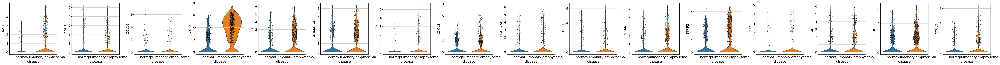

In [76]:
sc.pl.violin(
    fibroblast,
    keys=["HAS1", "CSF3", "CCL19", "CCL2", "IL6", "ADAMTS4", "TFPI2", "CXCL8", "PLA2G2A", "CCL11", "VCAM1", "SFRP2", "PI16", "CXCL1", "CXCL2", "CXCL3"],
    groupby="disease",
    save='emphysema_fibroblast_de_genes.svg', layer="normalized_counts"
)

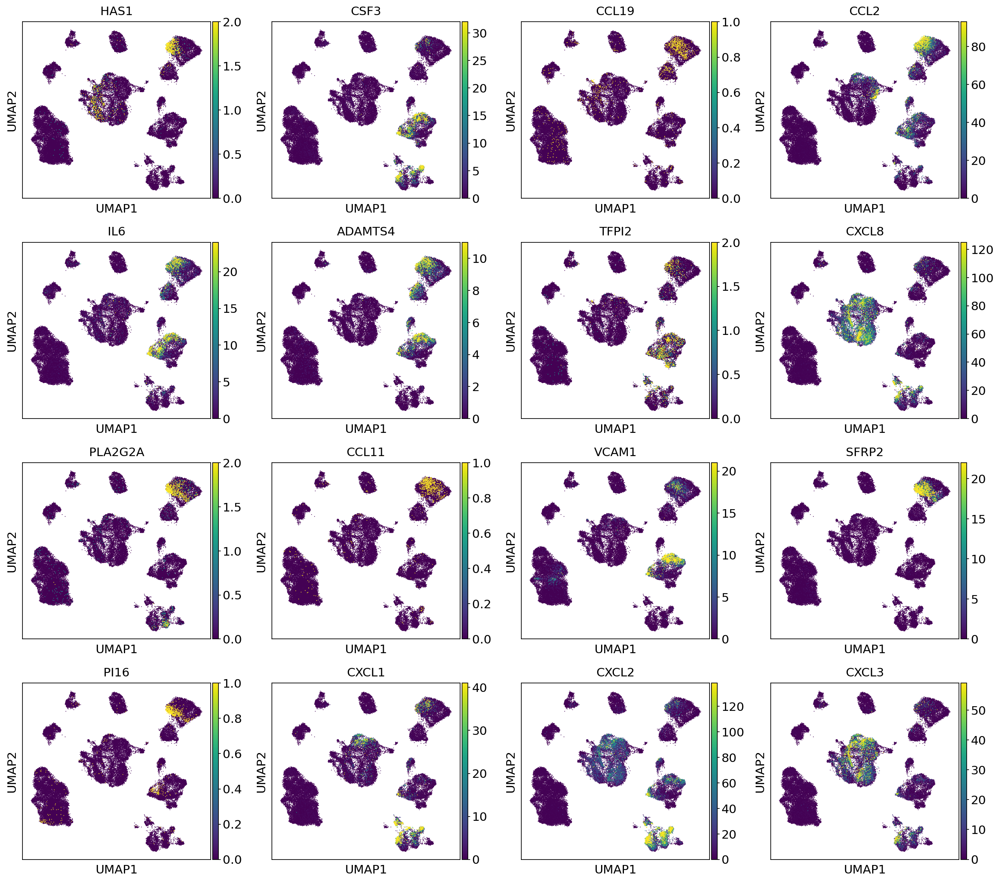

In [76]:
sc.pl.umap(
    emphysema_adata,
    gene_symbols='feature_name-0',
    color=["HAS1", "CSF3", "CCL19", "CCL2", "IL6", "ADAMTS4", "TFPI2", "CXCL8", "PLA2G2A", "CCL11", "VCAM1", "SFRP2", "PI16", "CXCL1", "CXCL2", "CXCL3"],
    ncols=4,
    frameon=True,
    legend_fontsize=8,
    vmax='p99',
    size=3,
    save='emphysema_fibroblast_de_genes.svg'
)

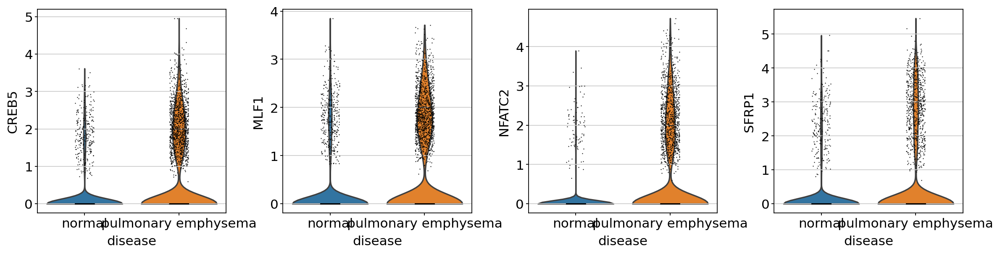

In [16]:
sc.pl.violin(
    fibroblast,
    gene_symbols='feature_name-0',
    keys=["CREB5", "MLF1", "NFATC2", "SFRP1"],
    groupby="disease",
    layer="normalized_counts"
)

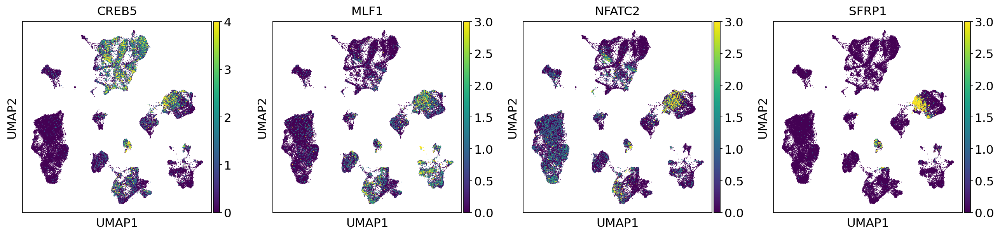

In [22]:
sc.pl.umap(
    emphysema_adata,
    gene_symbols='feature_name-0',
    color=["CREB5", "MLF1", "NFATC2", "SFRP1"],
    ncols=4,
    frameon=True,
    legend_fontsize=8,
    vmax='p99',
    size=3,
)

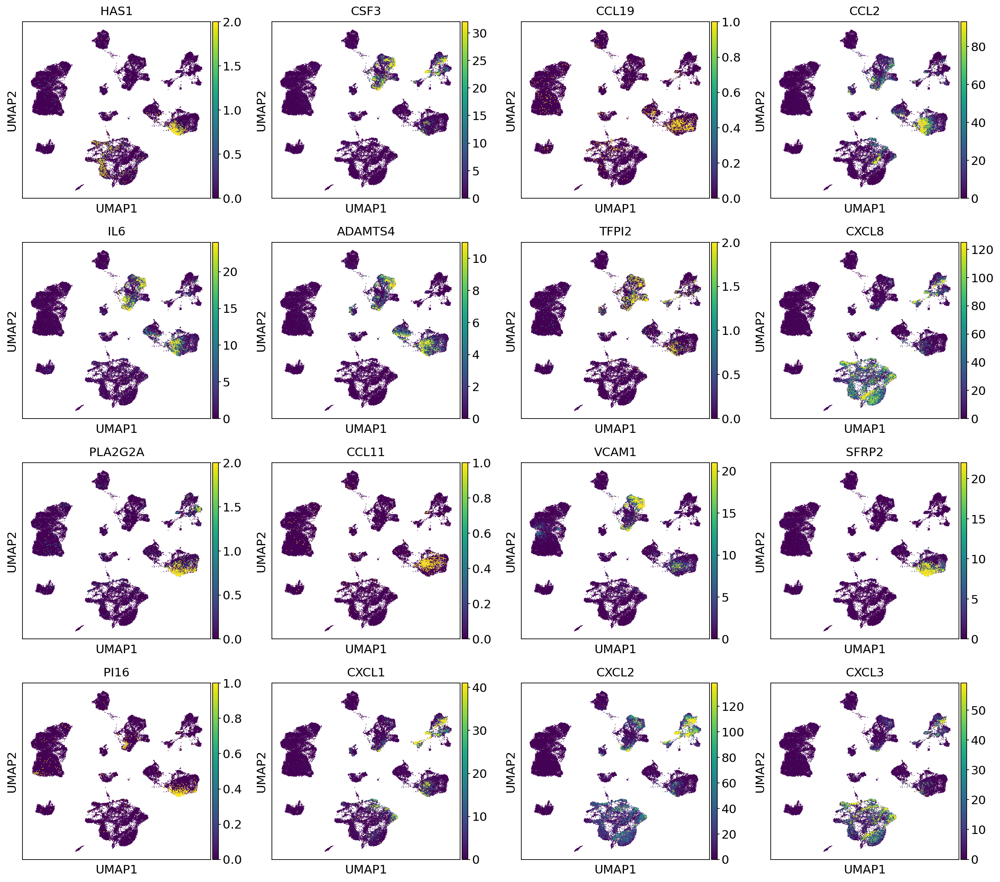

In [ ]:
sc.pl.umap(
    emphysema_adata,
    gene_symbols='feature_name-0',
    color=["HAS1", "CSF3", "CCL19", "CCL2", "IL6", "ADAMTS4", "TFPI2", "CXCL8", "PLA2G2A", "CCL11", "VCAM1", "SFRP2", "PI16", "CXCL1", "CXCL2", "CXCL3"],
    ncols=4,
    frameon=True,
    legend_fontsize=8,
    vmax='p99',
    size=3,
    save='emphysema_fibroblast_de_genes.svg'
)

/home/cane/miniconda3/envs/hub_paper/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


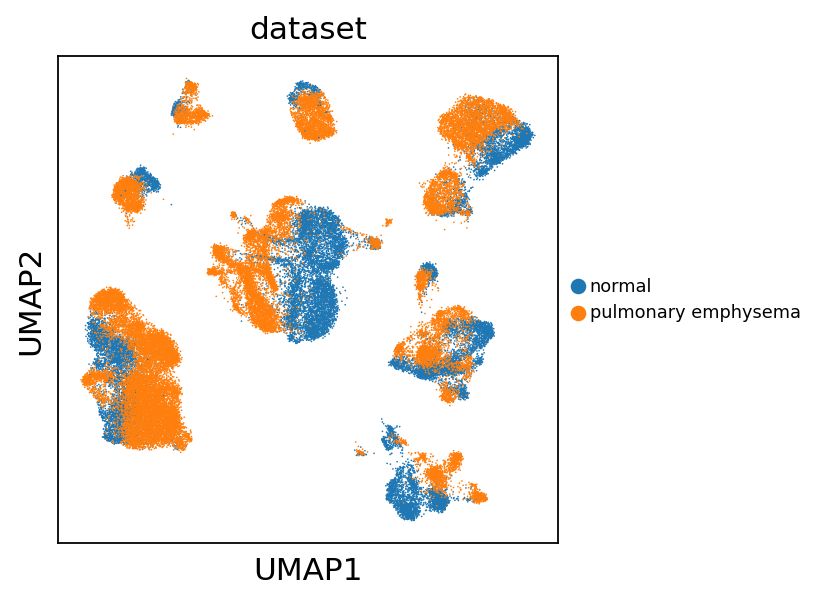

In [77]:
sc.pl.umap(
    emphysema_adata,
    color=["disease"],
    ncols=1,
    frameon=True,
    save="emphysema_umap_disease.svg",
    title="dataset",
    legend_fontsize=8
)

In [78]:
emphysema_adata.write_h5ad(f"{local_dir}/emphysema_adata_finished.h5ad")

In [37]:
fibroblast_idx = emphysema_adata.obs["celltype"].isin(['Distal fibroblast', 'Proximal fibroblast', 'Peribronchial fibroblast']) # ['Monocyte', 'Macrophage', 'Dendritic cell']) # 

fibroblast = emphysema_adata[fibroblast_idx].copy()
cell_idx1 = fibroblast.obs["disease"] == 'pulmonary emphysema'
cell_idx2 = fibroblast.obs["disease"] == 'normal'

In [38]:
scvi.model.SCANVI.prepare_query_anndata(fibroblast, local_dir)
query_save_path = f"{local_dir}/query_model_query"
query_fibroblast = scvi.model.SCANVI.load(query_save_path, adata=fibroblast)

INFO     File /external_data/other/scvi-hub/scvi-hub/model.pt already downloaded                                   


INFO     Found 96.85000000000001% reference vars in query data.                                                    
INFO     File /external_data/other/scvi-hub/scvi-hub//query_model_query/model.pt already downloaded                


An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.


In [46]:
de_change = query_fibroblast.differential_expression(idx1=cell_idx1, idx2=cell_idx2, batch_correction=True, filter_outlier_cells=True, fdr_target=0.1)
de_change.index = [fibroblast.var.loc[i, 'feature_name-0'] for i in de_change.index]
de_change[de_change[['non_zeros_proportion1', 'non_zeros_proportion2']].max(1)>0.05].head(50)

DE...:   0%|          | 0/1 [00:00<?, ?it/s]

DE...: 100%|██████████| 1/1 [00:07<00:00,  7.13s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,lfc_min,lfc_max,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.1
CSF3,0.956156,0.043844,3.082287,0.000135,0.000042,0.0,0.25,2.239612,2.353872,3.687891,-11.155987,13.682636,0.600703,0.627022,0.135230,0.061653,1.986415,1.638460,True
CCL19,0.953554,0.046446,3.021895,0.000919,0.000334,0.0,0.25,1.879909,2.016018,3.097796,-11.409817,14.403759,1.903133,0.977700,0.073529,0.108439,5.727788,2.908488,True
CCL2,0.951151,0.048849,2.968942,0.014696,0.005107,0.0,0.25,2.208599,2.296290,2.567422,-8.164418,11.168874,32.217072,5.729340,0.835678,0.409270,130.369688,21.256987,True
HAS1,0.948348,0.051652,2.910200,0.000338,0.000033,0.0,0.25,2.652958,2.574325,3.658107,-9.786606,15.141153,1.100384,0.043288,0.186061,0.013118,3.692019,0.112694,True
ADAMTS4,0.945345,0.054655,2.850516,0.000751,0.000238,0.0,0.25,1.971137,2.017994,2.378921,-5.871817,9.519203,1.919437,1.490599,0.413683,0.264101,7.575547,5.427935,True
IL6,0.941942,0.058058,2.786500,0.001486,0.000696,0.0,0.25,1.593735,1.736610,2.532668,-7.487481,9.995093,3.982097,1.942282,0.473465,0.243551,15.810772,6.276267,True
CXCL8,0.937137,0.062863,2.701874,0.000891,0.000313,0.0,0.25,1.735817,1.812425,2.475980,-6.695504,9.520049,2.744246,1.780498,0.323210,0.306952,10.636179,6.692544,True
TFPI2,0.936737,0.063263,2.695097,0.000147,0.000045,0.0,0.25,1.392768,1.375776,2.740101,-8.014462,10.271868,0.313299,0.087014,0.067136,0.023174,1.292842,0.289637,True
CXCL1,0.935736,0.064264,2.678329,0.001151,0.000440,0.0,0.25,1.669214,1.764963,2.580824,-7.549264,9.665045,2.505115,1.752077,0.250000,0.126804,7.947480,4.893453,True
PLA2G2A,0.935536,0.064464,2.675005,0.001429,0.000838,0.0,0.25,0.865790,0.844045,3.165365,-9.500798,11.439165,2.802430,1.057280,0.178708,0.108002,9.046587,3.476307,True


In [47]:
de_change = de_change[de_change[['scale1', 'scale2']].max(1)>1e-4]

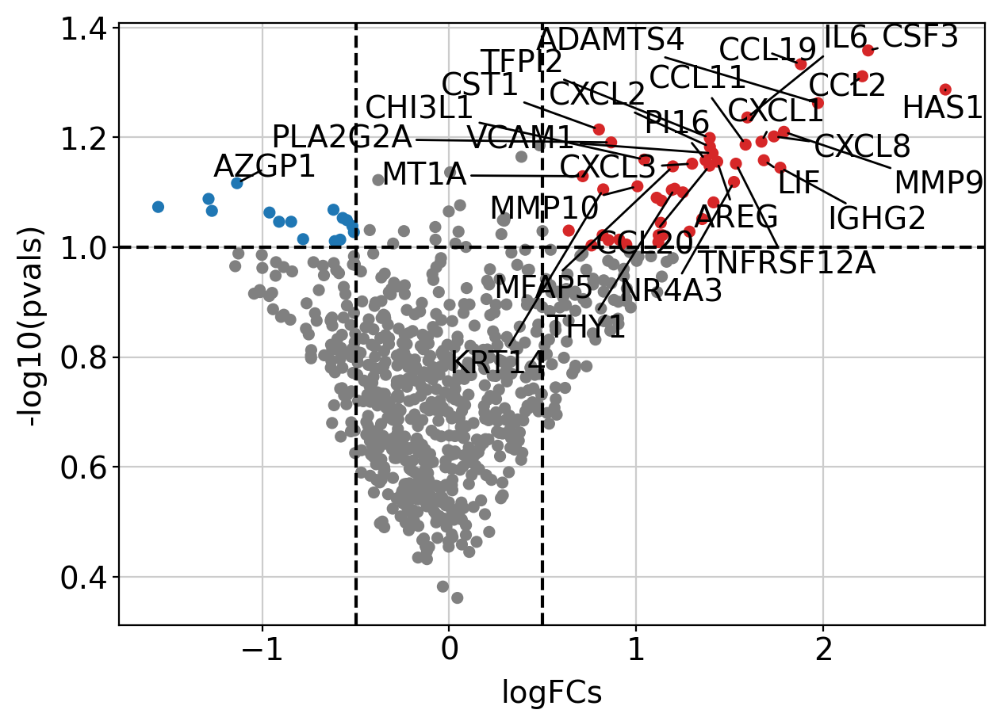

In [48]:
import decoupler as dc

dc.plot_volcano_df(de_change, x='lfc_mean', y='proba_not_de', top=30, sign_thr=0.1, lFCs_thr=0.5, lFCs_limit=3)
plt.savefig(f'{local_dir}/fibroblast_emphysema_scvi_volcano.svg')
plt.show()

In [55]:
de_change = de_change[de_change[['non_zeros_proportion1', 'non_zeros_proportion2']].max(1)>0.05]
de_change['padj'] = - np.log10(de_change['proba_not_de'])

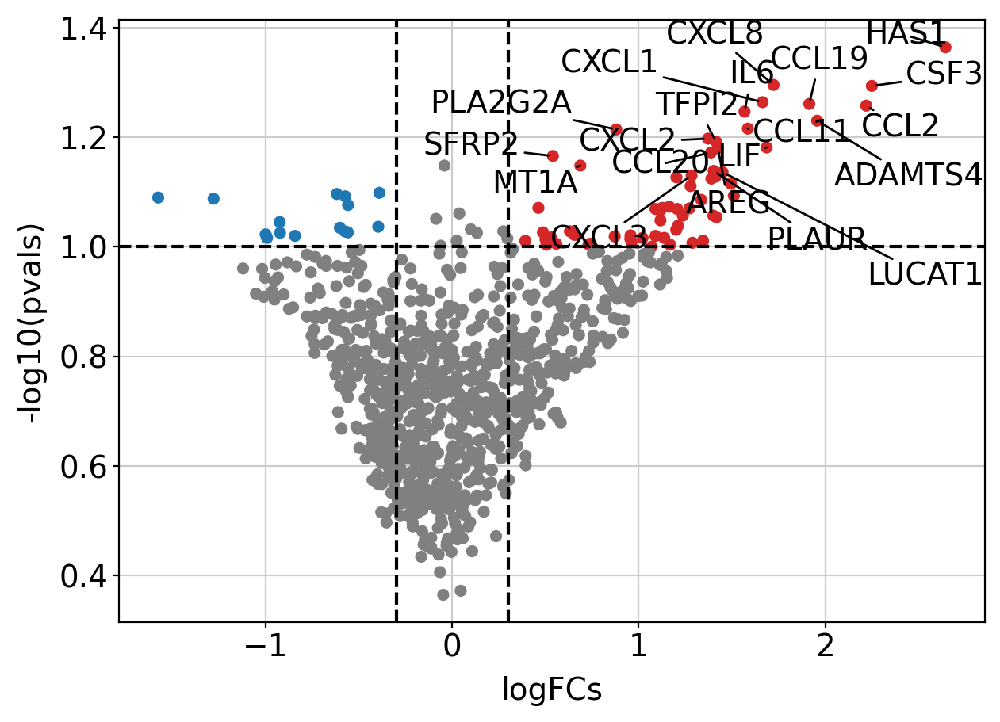

In [57]:
import decoupler as dc

dc.plot_volcano_df(de_change, x='lfc_mean', y='proba_not_de', top=20, sign_thr=0.1, lFCs_thr=0.3, lFCs_limit=3)
plt.savefig('fibroblast_emphysema_scvi.pdf')
plt.show()

In [50]:
fibroblast_idx = emphysema_adata.obs["celltype"].isin(['Distal fibroblast', 'Proximal fibroblast', 'Peribronchial fibroblast']) # 'Monocyte', 'Macrophage', 'Dendritic cell'

fibroblast = emphysema_adata[fibroblast_idx].copy()
fibroblast.var.index = fibroblast.var['feature_name-0']
fibroblast_raw = query_data_raw[fibroblast_idx].copy()
fibroblast_raw.var.index = fibroblast_raw.var['feature_name']


In [21]:
fibroblast.var

,feature_is_filtered-0,original_gene_symbols-0,feature_name-0,feature_reference-0,feature_biotype-0,feature_is_filtered-1,feature_name-1,feature_reference-1,feature_biotype-1,name-1
feature_name-0,,,,,,,,,,
A1BG,False,A1BG,A1BG,NCBITaxon:9606,gene,False,A1BG,NCBITaxon:9606,gene,A1BG
A2M,False,A2M,A2M,NCBITaxon:9606,gene,False,A2M,NCBITaxon:9606,gene,A2M
ABCA1,False,ABCA1,ABCA1,NCBITaxon:9606,gene,False,ABCA1,NCBITaxon:9606,gene,ABCA1
ABCA3,False,ABCA3,ABCA3,NCBITaxon:9606,gene,False,ABCA3,NCBITaxon:9606,gene,ABCA3
ABCA6,False,ABCA6,ABCA6,NCBITaxon:9606,gene,False,ABCA6,NCBITaxon:9606,gene,ABCA6
...,...,...,...,...,...,...,...,...,...,...
ZNF80,False,ZNF80,ZNF80,NCBITaxon:9606,gene,False,ZNF80,NCBITaxon:9606,gene,ZNF80
ZNF831,False,ZNF831;RP3-492J12.2,ZNF831,NCBITaxon:9606,gene,False,ZNF831,NCBITaxon:9606,gene,ZNF831
COL4A1,False,COL4A1,COL4A1,NCBITaxon:9606,gene,False,COL4A1,NCBITaxon:9606,gene,COL4A1


In [24]:
import decoupler as dc

In [71]:
# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    fibroblast,
    sample_col='donor_id',
    groups_col=None,
    mode='sum',
    min_cells=10,
    min_counts=1000,
)
pdata

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 6 × 1867
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', "3'_or_5'", 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'core_or_extension', 'dataset', 'fresh_or_frozen', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'original_ann_level_1', 'original_ann_level_2', 'original_ann_level_3', 'original_ann_level_4', 'original_ann_level_5', 'original_ann_nonharmonized', 'reannotation_type', 'sample', 'scanvi_label', 'sequencing_platform', 'smoking_status', 'study', 'subject_type', 'tissue_coarse_unharmonized', 'tissue

In [72]:
# Obtain genes that pass the thresholds
genes = dc.filter_by_expr(pdata, group='disease', min_count=50, min_total_count=150)

# Filter by these genes
pdatas = pdata[:, genes].copy()

In [73]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [74]:
# Build DESeq2 object
dds = DeseqDataSet(
    adata=pdatas,
    design_factors=['disease'],
    ref_level=['disease', 'normal'],
    refit_cooks=True,
)

In [75]:
# Compute LFCs
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.28 seconds.

Fitting dispersion trend curve...
... done in 0.03 seconds.

Fitting MAP dispersions...
... done in 0.25 seconds.

Fitting LFCs...
... done in 0.12 seconds.

Refitting 0 outliers.



In [76]:
stat_res = DeseqStats(dds)

In [77]:
stat_res.summary()

Log2 fold change & Wald test p-value: disease pulmonary emphysema vs normal
                    baseMean  log2FoldChange     lfcSE      stat    pvalue  \
feature_name-0                                                               
A1BG              218.466232       -0.629781  0.388149 -1.622523  0.104691   
A2M             43308.699219       -0.435334  0.164623 -2.644431  0.008183   
ABCA1            1072.297852       -0.560953  0.437641 -1.281765  0.199925   
ABCA6            2244.057861       -1.403264  0.530954 -2.642912  0.008220   
ABCA8            2675.596924       -0.273777  0.211783 -1.292720  0.196108   
...                      ...             ...       ...       ...       ...   
ZEB1              768.199219       -0.633288  0.340127 -1.861915  0.062615   
ZEB2             2817.994141       -0.426693  0.292706 -1.457753  0.144909   
ZFP36L2          7061.826172        0.270968  0.344311  0.786988  0.431289   
ZNF267            202.460938        0.333664  0.194619  1.714452  

Running Wald tests...
... done in 0.14 seconds.



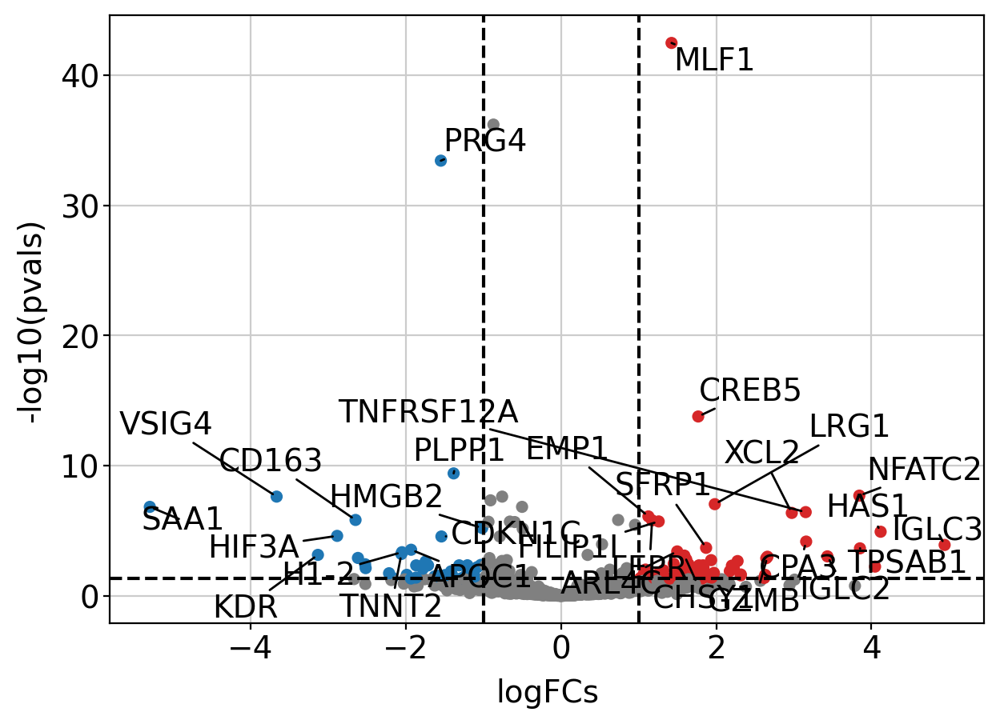

In [78]:
results_df = stat_res.results_df
dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', top=30, sign_thr=0.05, lFCs_thr=1.0, lFCs_limit=12)
plt.savefig('fibroblast_emphysema.svg')
plt.show()

In [52]:
# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    fibroblast_raw,
    sample_col='donor_id',
    groups_col=None,
    mode='sum',
    min_cells=10,
    min_counts=1000,
)
pdata

/home/cane/miniconda3/envs/resolvi_new/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 6 × 22162
    obs: 'donor_id', 'organism_ontology_term_id', 'assay_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'is_primary_data', 'sex_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'cell_type_ontology_term_id', 'suspension_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'compartment', 'psbulk_n_cells', 'psbulk_counts'
    var: 'name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype'
    layers: 'psbulk_props'

In [64]:
# Obtain genes that pass the thresholds
genes = dc.filter_by_expr(pdata, group='disease', min_count=50, min_total_count=150)

# Filter by these genes
pdatas = pdata[:, genes].copy()

In [65]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [66]:
# Build DESeq2 object
dds = DeseqDataSet(
    adata=pdatas,
    design_factors=['disease'],
    ref_level=['disease', 'normal'],
    refit_cooks=True,
)

In [67]:
# Compute LFCs
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 2.54 seconds.

Fitting dispersion trend curve...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 2.56 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Refitting 0 outliers.



In [68]:
stat_res = DeseqStats(dds)

In [69]:
stat_res.summary()

Running Wald tests...


Log2 fold change & Wald test p-value: disease pulmonary emphysema vs normal
                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
feature_name                                                               
A1BG            218.423477       -0.384812  0.437954 -0.878660  0.379586   
A2M           42954.488281       -0.151477  0.128869 -1.175430  0.239823   
A4GALT          293.922302       -0.208888  0.236940 -0.881607  0.377990   
AAAS             94.283714       -0.662132  0.225331 -2.938484  0.003298   
AACS             72.293442        0.298849  0.221279  1.350552  0.176839   
...                    ...             ...       ...       ...       ...   
ZXDC            178.619522       -0.383037  0.279565 -1.370117  0.170650   
ZYG11B          277.373566       -0.365910  0.177755 -2.058501  0.039542   
ZYX            1455.315063        0.238948  0.156272  1.529052  0.126251   
ZZEF1           196.579849       -0.093095  0.241855 -0.384919  0.700297   
ZZZ3        

... done in 0.35 seconds.



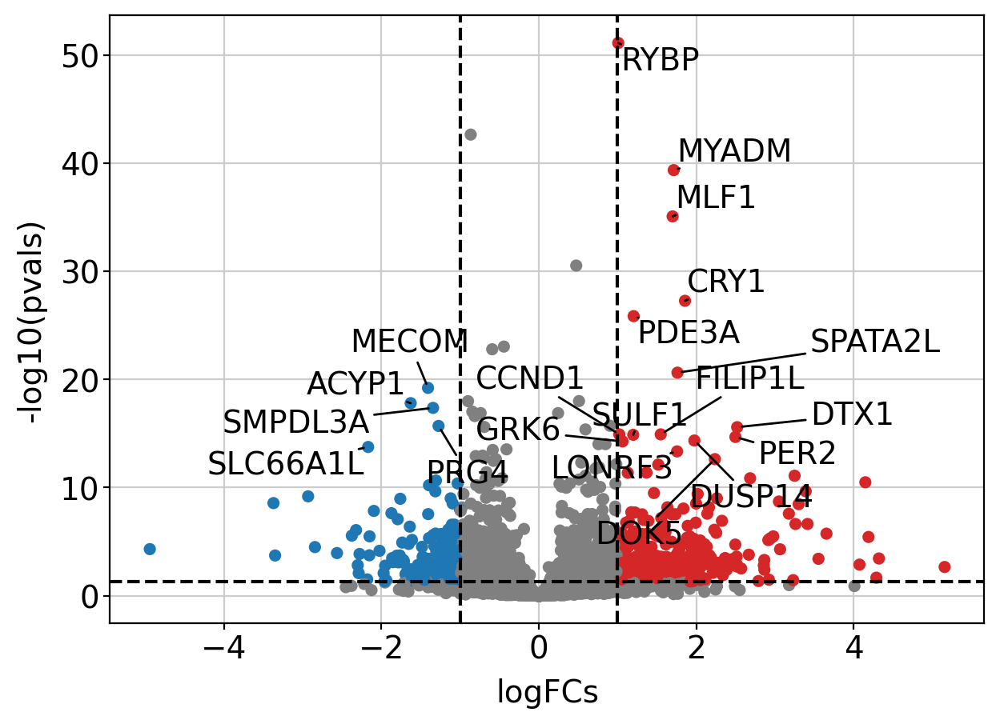

In [70]:
results_df = stat_res.results_df
dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', top=20, sign_thr=0.05, lFCs_thr=1.0, lFCs_limit=12)
plt.savefig('fibroblast_emphysema_all_genes.svg')
plt.show()